# Read Write Bounding Box

In [1]:
import imgaug.augmenters as iaa
import imageio
import imgaug as ia
import numpy as np
import pandas as pd
import os
from matplotlib.pyplot import imsave, imshow
import shutil


## Resize with Bounding Boxes

BoundingBox(x1=39.0625, y1=42.9688, x2=156.2500, y2=160.1562, label=None)
BoundingBox(x1=19.5312, y1=19.5312, x2=35.1562, y2=35.1562, label=None)
(200, 200, 3)


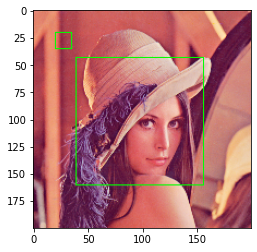

In [2]:
def imgAugResize(img,bs,longerSide=224,isImageWithBb=False):
    bbs = ia.BoundingBoxesOnImage(bs, shape=img.shape)
    seq = iaa.Sequential([
        iaa.Resize({"shorter-side": "keep-aspect-ratio", "longer-side": longerSide,"interpolation":"cubic" })
    ])
    seq_det = seq.to_deterministic()

    image_aug = seq_det.augment_images([img])[0]

    bbs_resized=seq_det.augment_bounding_boxes(bbs)
    # print(p,bbs_aug)


    image_aug=bbs_resized.draw_on_image(image_aug) if isImageWithBb else image_aug
    images_resized=image_aug

    return (images_resized,bbs_resized.bounding_boxes)



img = imageio.imread("https://upload.wikimedia.org/wikipedia/en/7/7d/Lenna_%28test_image%29.png")    
bs=[
    ia.BoundingBox(x1=100., y1=110., x2=400., y2=410),
    ia.BoundingBox(x1=50., y1=50., x2=90., y2=90)
]    

# ia.imshow(bbsOnImage(img,bs))
imgAndBb=imgAugResize(img,bs,200,True)
for i in imgAndBb[1]:
    print(i)
imshow(imgAndBb[0])    
# ia.imshow(addBoudingBox(imgAndBb[0],imgAndBb[1]))
print(imgAndBb[0].shape)

In [3]:
help(ia.imshow)

Help on function imshow in module imgaug.imgaug:

imshow(image, backend='matplotlib')
    Show an image in a window.
    
    **Supported dtypes**:
    
        * ``uint8``: yes; not tested
        * ``uint16``: ?
        * ``uint32``: ?
        * ``uint64``: ?
        * ``int8``: ?
        * ``int16``: ?
        * ``int32``: ?
        * ``int64``: ?
        * ``float16``: ?
        * ``float32``: ?
        * ``float64``: ?
        * ``float128``: ?
        * ``bool``: ?
    
    Parameters
    ----------
    image : (H,W,3) ndarray
        Image to show.
    
    backend : {'matplotlib', 'cv2'}, optional
        Library to use to show the image. May be either matplotlib or
        OpenCV ('cv2'). OpenCV tends to be faster, but apparently causes more
        technical issues.



## bbsYolo5ToBbsImgAug

In [4]:
def bbsYolo5ToBbsImgAug(img,bbs):
    bbsImgAug=[]
    w=img.shape[1]
    h=img.shape[0]
    for r in bbs.iterrows():
        ll=r[1].to_list()
        wrh=ll[3]/2 # width ratio half
        hrh=ll[4]/2 # hight ratio half
        x1= ( ll[1]-wrh )*w
        x2= ( ll[1]+wrh )*w
        y1= ( ll[2]-hrh )*h
        y2= ( ll[2]+hrh )*h
        bbsImgAug.append(ia.BoundingBox(x1=x1, y1=y1, x2=x2, y2=y2,label=str(int(ll[0]))))
    return bbsImgAug

## addBoudingBox


In [24]:

def addBoudingBox(img,bbs):
    bbsoi = ia.BoundingBoxesOnImage(
        bbsYolo5ToBbsImgAug(img,bbs) , 
        shape=img.shape
    )
    imgBouded = bbsoi.draw_on_image(img,color=(255, 0, 0), size=3)
    return imgBouded




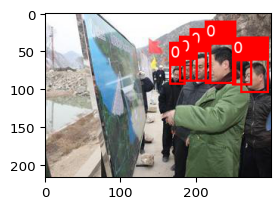

In [25]:
bb_path='/prj/nowage/ImgAugWithSR/imgs/HardHatSample__small/labels/000004_jpg.rf.8f0984ca266ad0bb1ccce4a3dc095291.txt'
img_path='/prj/nowage/ImgAugWithSR/imgs/HardHatSample__small/images/000004_jpg.rf.8f0984ca266ad0bb1ccce4a3dc095291.jpg'

img = imageio.imread(img_path)
bbs=pd.read_csv(bb_path,sep=" ", header=None)

ia.imshow(addBoudingBox(img,bbs))

In [8]:
bbsImgAug=bbsYolo5ToBbsImgAug(img,bbs) 
bbsImgAug

[BoundingBox(x1=192.6667, y1=51.2546, x2=217.3333, y2=87.8650, label=0),
 BoundingBox(x1=213.3333, y1=40.6043, x2=250.0000, y2=90.5276, label=0),
 BoundingBox(x1=260.0000, y1=61.9049, x2=293.3333, y2=103.1748, label=0),
 BoundingBox(x1=178.6667, y1=60.5736, x2=198.6667, y2=87.8650, label=0),
 BoundingBox(x1=166.0000, y1=69.2270, x2=183.3333, y2=91.8589, label=0),
 BoundingBox(x1=249.3333, y1=62.5706, x2=271.3333, y2=93.1902, label=0)]

## bbsImgAugToBbsYolo5
- c0 : class
- c1 : 중앙에서 X축으로 이동된 비율
- c2 : 중앙에서 Y축으로 이동된 비율
- c3 : X축에서 차지하는 비율
- c4 : Y축이서 차지하는 비율

In [9]:
def bbsImgAugToBbsYolo5(img,bbs):
    bbsYolo5=[]
    w=img.shape[1] #  width
    h=img.shape[0] #  height
    ox=w/2  # origin x
    oy=h/2  # origin y
    for bb in bbs:
        c0=bb.label  # 현재는 한가지의 객체만 찾는 방식이라
        c1= ((bb.x2 + bb.x1)/2 ) / w
        c2= ((bb.y2 + bb.y1)/2) / h
        c3= abs(bb.x2 - bb.x1)/w
        c4= abs(bb.y2 - bb.y1)/h
        bbsYolo5.append([c0,c1,c2,c3,c4])
        df_bbsYolo5=pd.DataFrame(bbsYolo5)
    return df_bbsYolo5
bbs2=bbsImgAugToBbsYolo5(img,bbsImgAug)

In [10]:
def bbsImgAugToBbsYolo5(img,bbs):
    bbsYolo5=[]
    w=img.shape[1] #  width
    h=img.shape[0] #  height
    ox=w/2  # origin x
    oy=h/2  # origin y
    for bb in bbs:
        c0=bb.label  # 현재는 한가지의 객체만 찾는 방식이라
        c1= ((bb.x2 + bb.x1)/2 ) / w
        c2= ((bb.y2 + bb.y1)/2) / h
        c3= abs(bb.x2 - bb.x1)/w
        c4= abs(bb.y2 - bb.y1)/h
        bbsYolo5.append([c0,c1,c2,c3,c4])
        df_bbsYolo5=pd.DataFrame(bbsYolo5)
    return df_bbsYolo5
bbs2=bbsImgAugToBbsYolo5(img,bbsImgAug)

BoundingBoxesOnImage([BoundingBox(x1=-56.0000, y1=-56.0000, x2=244.0000, y2=244.0000, label=None)], shape=(200, 200, 3))
BoundingBoxesOnImage([BoundingBox(x1=-212.0000, y1=-212.0000, x2=88.0000, y2=88.0000, label=None)], shape=(200, 200, 3))
BoundingBoxesOnImage([BoundingBox(x1=-212.0000, y1=-56.0000, x2=88.0000, y2=244.0000, label=None)], shape=(200, 200, 3))
BoundingBoxesOnImage([BoundingBox(x1=-212.0000, y1=100.0000, x2=88.0000, y2=400.0000, label=None)], shape=(200, 200, 3))
BoundingBoxesOnImage([BoundingBox(x1=-56.0000, y1=-212.0000, x2=244.0000, y2=88.0000, label=None)], shape=(200, 200, 3))
BoundingBoxesOnImage([BoundingBox(x1=-56.0000, y1=100.0000, x2=244.0000, y2=400.0000, label=None)], shape=(200, 200, 3))
BoundingBoxesOnImage([BoundingBox(x1=100.0000, y1=-212.0000, x2=400.0000, y2=88.0000, label=None)], shape=(200, 200, 3))
BoundingBoxesOnImage([BoundingBox(x1=100.0000, y1=-56.0000, x2=400.0000, y2=244.0000, label=None)], shape=(200, 200, 3))
BoundingBoxesOnImage([BoundingBo

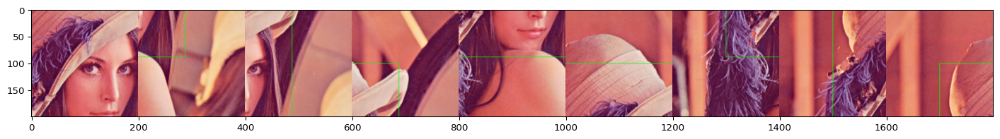

In [11]:
  
def imgAugCropTo9(img,bs,isImageWithBb=False,size=400):
    bbs = ia.BoundingBoxesOnImage(bs, shape=img.shape)
    images_croped=[]
    bbs_croped=[]
    position=[ 'center', 'left-top', 'left-center', 'left-bottom', 'center-top', 'center-bottom', 'right-top', 'right-center', 'right-bottom']

    for p in position:
        seq = iaa.Sequential([
            iaa.CropToFixedSize(width=size, height=size,position=p)
        ])
        seq_det = seq.to_deterministic()

        image_aug = seq_det.augment_images([img])[0]

        bbs_aug   = seq_det.augment_bounding_boxes([bbs])[0]
        bbs_croped.append(bbs_aug)
        # print(p,bbs_aug)


        image_aug=bbs_aug.draw_on_image(image_aug) if isImageWithBb else image_aug
        images_croped.append(image_aug)

    return (images_croped,bbs_croped)

# fname='000002_jpg.rf.14c099486ff0a2df2d20d82da93b46f5'
# bb_path=labels_path+fname+'.txt'
# img_path=images_super_path+fname+'.jpg'

# img = imageio.imread(img_path)
# bbsYolo5=pd.read_csv(bb_path,sep=" ", header=None)
# bs=bbsYolo5ToBbsImgAug(img,bbsYolo5)


img = imageio.imread("https://upload.wikimedia.org/wikipedia/en/7/7d/Lenna_%28test_image%29.png")    
bs=[
    ia.BoundingBox(x1=100., y1=100., x2=400., y2=400)
]    

imgAndBb=imgAugCropTo9(img,bs,True,200)
for i in imgAndBb[1]:
    print(i)
ia.imshow(np.hstack(imgAndBb[0]))    



In [6]:
basePath="/prj/nowage/ImgAugWithSR/imgs/HardHatSample__small/"
images_path         = basePath + "images/"
images_resized_path = basePath + "images_resized/"
images_super_path   = basePath + "images_super/"
images_chopped_path = basePath + "images_chopped/"
labels_path         = basePath + "labels/"
labels_resized_path = basePath + "labels_resized/"
labels_super_path   = basePath + "labels_super/"
labels_chopped_path = basePath + "labels_chopped/"# !ls {images_path}

In [7]:
def resizeImageBatch(from_images_path, to_images_path,from_bbs_path,to_bbs_path,longerSide=224):
    file_list = os.listdir(from_images_path)
    for img_name in file_list:
        img=imageio.imread(from_images_path+img_name)
        bbs_name=img_name.replace('.jpg','.txt')
        bbsYolo5=pd.read_csv(from_bbs_path+bbs_name ,sep=" ",header=None)
        bbsImgAug=bbsYolo5ToBbsImgAug(img,bbsYolo5)

        imgAndBb=imgAugResize(img,bbsImgAug,longerSide,False)
        imsave(to_images_path+img_name,imgAndBb[0])
        print(from_bbs_path + bbs_name, to_bbs_path +bbs_name) 
        # shutil.copy2(from_bbs_path + bbs_name, to_bbs_path +bbs_name) 
        # ia.imshow(bbsOnImage(imgAndBb[0],imgAndBb[1]))
        
resizeImageBatch(images_path, images_resized_path,labels_path,labels_resized_path,300 )
    
# !ls {images_super_path}


NameError: name 'bbsYolo5ToBbsImgAug' is not defined

In [14]:
!ls /prj/nowage/ImgAugWithSR/imgs/HardHatSample__small/images/

000001_jpg.rf.45fd629cae669b7236f4f5484605be64.jpg
000002_jpg.rf.14c099486ff0a2df2d20d82da93b46f5.jpg
000003_jpg.rf.da4ac3b48b7a600add2281eacaf7dd82.jpg
000004_jpg.rf.8f0984ca266ad0bb1ccce4a3dc095291.jpg


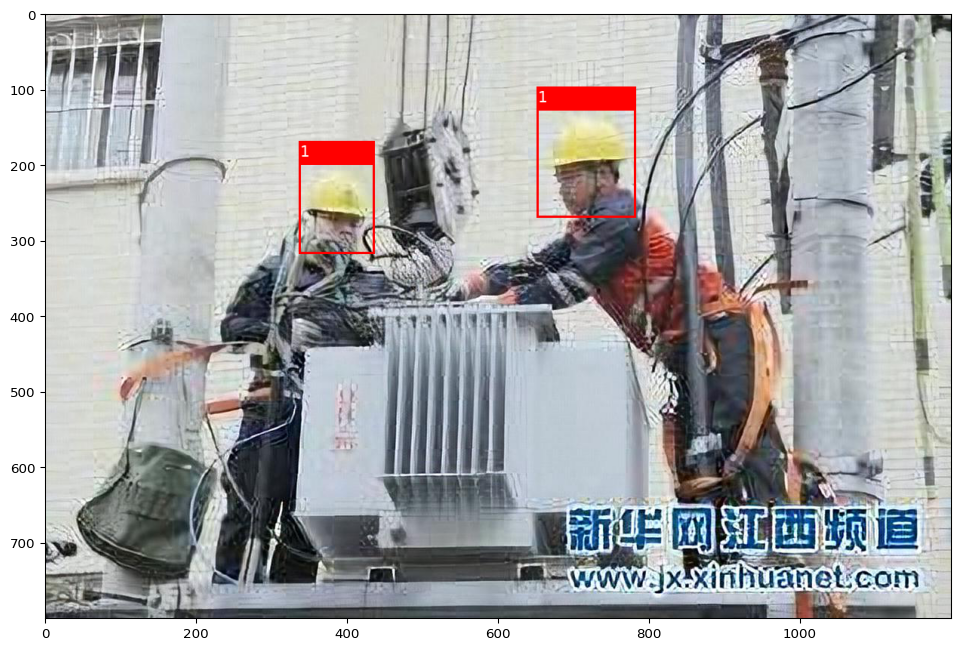

In [15]:
fname='000002_jpg.rf.14c099486ff0a2df2d20d82da93b46f5'
bb_path=labels_path+fname+'.txt'
img_path=images_super_path+fname+'.jpg'

img = imageio.imread(img_path)
bbsYolo5=pd.read_csv(bb_path,sep=" ", header=None)

ia.imshow(addBoudingBox(img,bbsYolo5))

In [16]:
bbsYolo5=pd.read_csv(bb_path,sep=" ", header=None,index_col=None)
bbsYolo5

,0,1,2,3,4
0,1,0.597,0.246246,0.106,0.174174
1,1,0.322,0.321321,0.080,0.144144


   0         1         2      3         4
0  1  0.263667 -0.003754  0.106  0.174174
1  1 -0.011333  0.071321  0.080  0.144144
-----
   0         1         2      3         4
0  1 -0.069667 -0.253754  0.106  0.174174
1  1 -0.344667 -0.178679  0.080  0.144144
-----
   0         1         2      3         4
0  1 -0.069667 -0.003754  0.106  0.174174
1  1 -0.344667  0.071321  0.080  0.144144
-----
   0         1         2      3         4
0  1 -0.069667  0.246246  0.106  0.174174
1  1 -0.344667  0.321321  0.080  0.144144
-----
   0         1         2      3         4
0  1  0.263667 -0.253754  0.106  0.174174
1  1 -0.011333 -0.178679  0.080  0.144144
-----
   0         1         2      3         4
0  1  0.263667  0.246246  0.106  0.174174
1  1 -0.011333  0.321321  0.080  0.144144
-----
   0      1         2      3         4
0  1  0.597 -0.253754  0.106  0.174174
1  1  0.322 -0.178679  0.080  0.144144
-----
   0      1         2      3         4
0  1  0.597 -0.003754  0.106  0.174174
1  1  0

/prj/nowage/ImgAugWithSR/imgaug/imgaug/imgaug.py:1969: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title("imgaug.imshow(%s)" % (image.shape,))


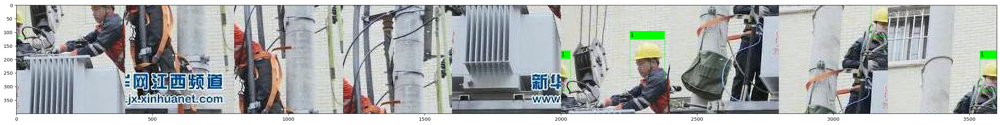

In [17]:


bbs=bbsYolo5ToBbsImgAug(img,bbsYolo5)
imgAndBb=imgAugCropTo9(img,bbs,True,400)
for bbs in imgAndBb[1]:
    print(bbsImgAugToBbsYolo5(img,bbs))
    print('-----')
ia.imshow(np.hstack(imgAndBb[0]))    


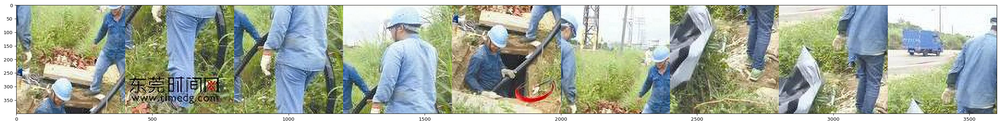

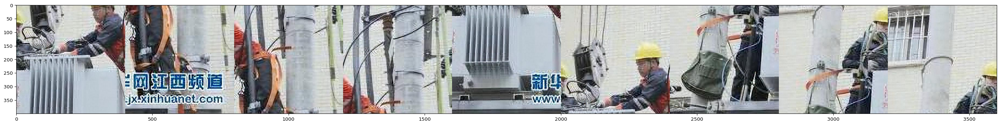

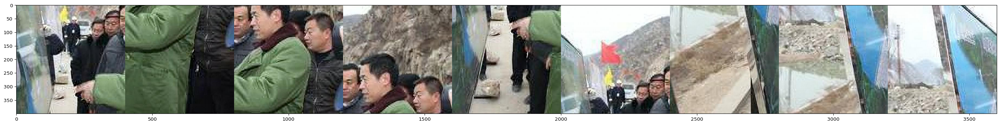

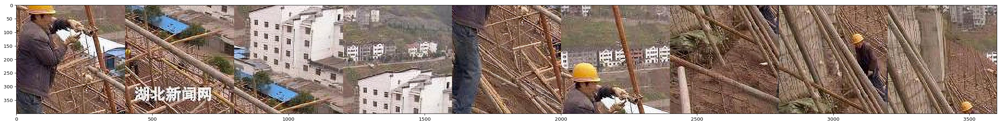

In [18]:
file_list = os.listdir(images_super_path)
for img_name in file_list:
    img=imageio.imread(images_super_path+img_name)
    imsave(images_chopped_path+img_name,img)
    file_name=img_name.replace('.jpg','')
    bbs_name=file_name+'.txt'
    bbsYolo5=pd.read_csv(labels_super_path+bbs_name ,sep=" ",header=None)
    bbsYolo5.to_csv(labels_chopped_path+bbs_name    ,sep=' ',header=False,index=False)
    bbsImgAug=bbsYolo5ToBbsImgAug(img,bbsYolo5)
    imgAndBb=imgAugCropTo9(img,bbsImgAug,False,400)
    i=0
    bbs=imgAndBb[1]
    imgs=imgAndBb[0]

    for bbsImgAug in bbs:
        chopped_bbs_name=file_name+'_'+str(i)+'.txt'
        chopped_img_name=file_name+'_'+str(i)+'.jpg'
        bbsYolo5=bbsImgAugToBbsYolo5(imgs[i],bbsImgAug)
        bbsYolo5.to_csv(labels_chopped_path + chopped_bbs_name ,sep=' ',header=False,index=False)
        imsave(images_chopped_path+chopped_img_name,imgs[i])
        i=i+1
    ia.imshow(np.hstack(imgAndBb[0]))    


In [19]:
!ls {images_chopped_path}


000001_jpg.rf.45fd629cae669b7236f4f5484605be64.jpg
000001_jpg.rf.45fd629cae669b7236f4f5484605be64_0.jpg
000001_jpg.rf.45fd629cae669b7236f4f5484605be64_1.jpg
000001_jpg.rf.45fd629cae669b7236f4f5484605be64_2.jpg
000001_jpg.rf.45fd629cae669b7236f4f5484605be64_3.jpg
000001_jpg.rf.45fd629cae669b7236f4f5484605be64_4.jpg
000001_jpg.rf.45fd629cae669b7236f4f5484605be64_5.jpg
000001_jpg.rf.45fd629cae669b7236f4f5484605be64_6.jpg
000001_jpg.rf.45fd629cae669b7236f4f5484605be64_7.jpg
000001_jpg.rf.45fd629cae669b7236f4f5484605be64_8.jpg
000002_jpg.rf.14c099486ff0a2df2d20d82da93b46f5.jpg
000002_jpg.rf.14c099486ff0a2df2d20d82da93b46f5_0.jpg
000002_jpg.rf.14c099486ff0a2df2d20d82da93b46f5_1.jpg
000002_jpg.rf.14c099486ff0a2df2d20d82da93b46f5_2.jpg
000002_jpg.rf.14c099486ff0a2df2d20d82da93b46f5_3.jpg
000002_jpg.rf.14c099486ff0a2df2d20d82da93b46f5_4.jpg
000002_jpg.rf.14c099486ff0a2df2d20d82da93b46f5_5.jpg
000002_jpg.rf.14c099486ff0a2df2d20d82da93b46f5_6.jpg
000002_jpg.rf.14c099486ff0a2df2d20d82da93b46f5_7.j

In [4]:
fname='000001_jpg.rf.45fd629cae669b7236f4f5484605be64'
bb_path=labels_chopped_path+fname+'.txt'
img_path=images_chopped_path+fname+'.jpg'

img = imageio.imread(img_path)
bbsYolo5=pd.read_csv(bb_path,sep=" ", header=None)

ia.imshow(addBoudingBox(img,bbsYolo5))

NameError: name 'labels_chopped_path' is not defined

In [3]:
fname='000004_jpg.rf.8f0984ca266ad0bb1ccce4a3dc095291_5'
bb_path=labels_chopped_path+fname+'.txt'
img_path=images_chopped_path+fname+'.jpg'

img = imageio.imread(img_path)
bbsYolo5=pd.read_csv(bb_path,sep=" ", header=None)

ia.imshow(addBoudingBox(img,bbsYolo5))

NameError: name 'labels_chopped_path' is not defined

In [74]:
bbsYolo5

,0,1,2,3,4
0,1,-0.209,-0.007508,0.318,0.348348
1,1,-1.034,0.142643,0.240,0.288288
